In [ ]:
# !pip install torchsummary
!pip install split-folders

In [ ]:
!nvidia-smi

Tue Mar 19 17:38:35 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla V100-SXM2-16GB           Off | 00000000:00:04.0 Off |                    0 |
| N/A   33C    P0              24W / 300W |      0MiB / 16384MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [1]:
#import splitfolders
import os
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from google.colab import drive

from sklearn.metrics import confusion_matrix, classification_report

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.tensorboard import SummaryWriter

%matplotlib inline

In [2]:
# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
DATASET_DIR = "/content/drive/MyDrive/AAI_Dataset/PlantVillage"

In [ ]:
# # Extracting the zip dataset
# import zipfile
# import os

# # Path to the zip file in Google Drive
# zip_file_path = f"{DATASET_DIR}/color.zip"

# # Destination folder to extract the zip file
# extracted_folder_path = f"{DATASET_DIR}/"

# # Check if the destination folder exists, if not, create it
# if not os.path.exists(extracted_folder_path):
#     os.makedirs(extracted_folder_path)

# # Extract the zip file
# with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
#     zip_ref.extractall(extracted_folder_path)

# # List the contents of the extracted folder
# extracted_files = os.listdir(extracted_folder_path)
# print("Files extracted successfully:")
# print(extracted_files)

Files extracted successfully:
['color.zip', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)']


In [ ]:
# Split folder into train, test and validation set.
#splitfolders.ratio('/content/drive/MyDrive/AAI_Dataset/PlantVillage/', output="/content/drive/MyDrive/AAI_Dataset/PlantVillage/", seed=1337, ratio=(.8, .1, .1))

Copying files: 7552 files [05:00, 25.17 files/s]


In [4]:
train_dir = DATASET_DIR + "/train"
valid_dir = DATASET_DIR + "/val"
test_dir = DATASET_DIR + "/test"
diseases = os.listdir(train_dir)

# Print diseases name
print(diseases)

['Apple___Black_rot', 'Apple___Apple_scab', 'Apple___healthy', 'Blueberry___healthy', 'Apple___Cedar_apple_rust', 'Cherry_(including_sour)___Powdery_mildew', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch', 'Strawberry___healthy', 'Tomato___Bacterial_spot', 'Tomato___Late_blight', 'Tomato___Early_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Target_Spot', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'T

In [5]:
print(f"Total classes are: {len(diseases)}")

Total classes are: 38


In [6]:
# Count the number of unique plants and disease
plants = set()
conditions = set()

number_of_diseases = 0

for plant in diseases:
    plant_name, condition = plant.split('___')
    conditions.add(condition)
    plant_name = plant_name.replace('_', ' ').replace(', ', ' ').title()
    plants.add(plant_name)
    if condition != 'healthy':
        number_of_diseases += 1

plants = list(plants)
conditions =list(conditions)

In [7]:
# Unique plants
print(f"Number of unique plants are: \n{plants}")

Number of unique plants are: 
['Pepper Bell', 'Orange', 'Cherry (Including Sour)', 'Squash', 'Corn (Maize)', 'Blueberry', 'Potato', 'Grape', 'Tomato', 'Apple', 'Peach', 'Raspberry', 'Soybean', 'Strawberry']


In [8]:
# Unique plants count
print(f"Number of unique plants: {len(plants)}")

Number of unique plants: 14


In [9]:
# Unique unique disease count
print(f"Number of unique disease: {number_of_diseases}")
print(conditions)

Number of unique disease: 26
['Target_Spot', 'Northern_Leaf_Blight', 'Tomato_mosaic_virus', 'Apple_scab', 'healthy', 'Black_rot', 'Septoria_leaf_spot', 'Powdery_mildew', 'Late_blight', 'Cercospora_leaf_spot Gray_leaf_spot', 'Spider_mites Two-spotted_spider_mite', 'Esca_(Black_Measles)', 'Leaf_Mold', 'Leaf_scorch', 'Tomato_Yellow_Leaf_Curl_Virus', 'Haunglongbing_(Citrus_greening)', 'Early_blight', 'Common_rust_', 'Bacterial_spot', 'Cedar_apple_rust', 'Leaf_blight_(Isariopsis_Leaf_Spot)']


In [10]:
nums = {disease: len(os.listdir(os.path.join(train_dir, disease))) for disease in diseases}

# Converting the nums dictionary to pandas DataFrame with plant name as index and number of images as column
img_per_class = pd.DataFrame(nums.values(), index=nums.keys(), columns=["No. of images"])

img_per_class

,No. of images
Apple___Black_rot,160
Apple___Apple_scab,160
Apple___healthy,160
Blueberry___healthy,160
Apple___Cedar_apple_rust,160
Cherry_(including_sour)___Powdery_mildew,160
Cherry_(including_sour)___healthy,160
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot,160
Corn_(maize)___Common_rust_,160
Corn_(maize)___Northern_Leaf_Blight,160


In [11]:
import torchvision
import torchvision.transforms as transforms

def get_image_transforms():
    return transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

image_data_transforms = {
    'training': get_image_transforms(),
    'validation': get_image_transforms(),
    'testing': get_image_transforms()
}





batch_size = 32
train_dataset = torchvision.datasets.ImageFolder(train_dir, transform=image_data_transforms['training'])
val_dataset = torchvision.datasets.ImageFolder(valid_dir, transform=image_data_transforms['validation'])
test_dataset = torchvision.datasets.ImageFolder(test_dir, transform=image_data_transforms['testing'])

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)



<ipython-input-12-fb203da1fe06>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=img_per_class, x=img_per_class.index, palette="viridis")


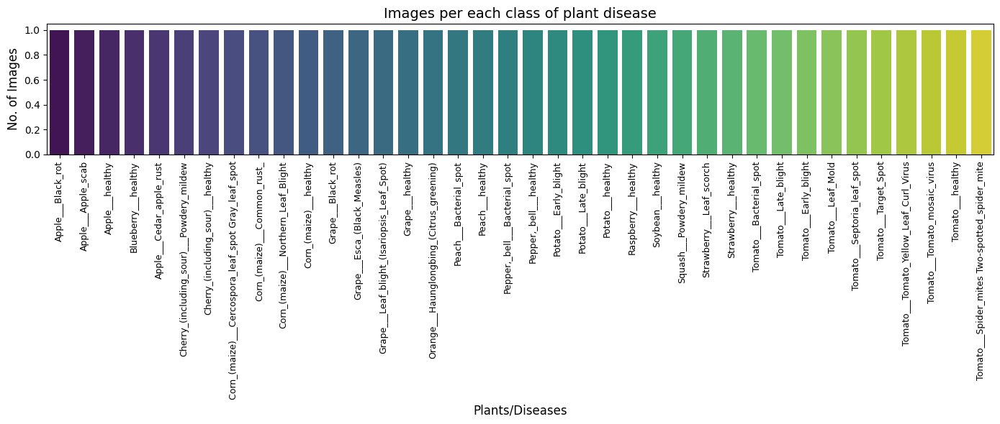

In [12]:
plt.figure(figsize=(14, 6))
sns.countplot(data=img_per_class, x=img_per_class.index, palette="viridis")
plt.xlabel('Plants/Diseases', fontsize=12)
plt.ylabel('No. of Images', fontsize=12)
plt.xticks(rotation=90, fontsize=9)
plt.title('Images per each class of plant disease', fontsize=14)
plt.tight_layout()
plt.show()

In [13]:
import torchvision.models as models

model = models.vgg19(num_classes=38,pretrained=False)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


In [14]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Device: {}".format(device))
model.to(device)

Device: cuda:0


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

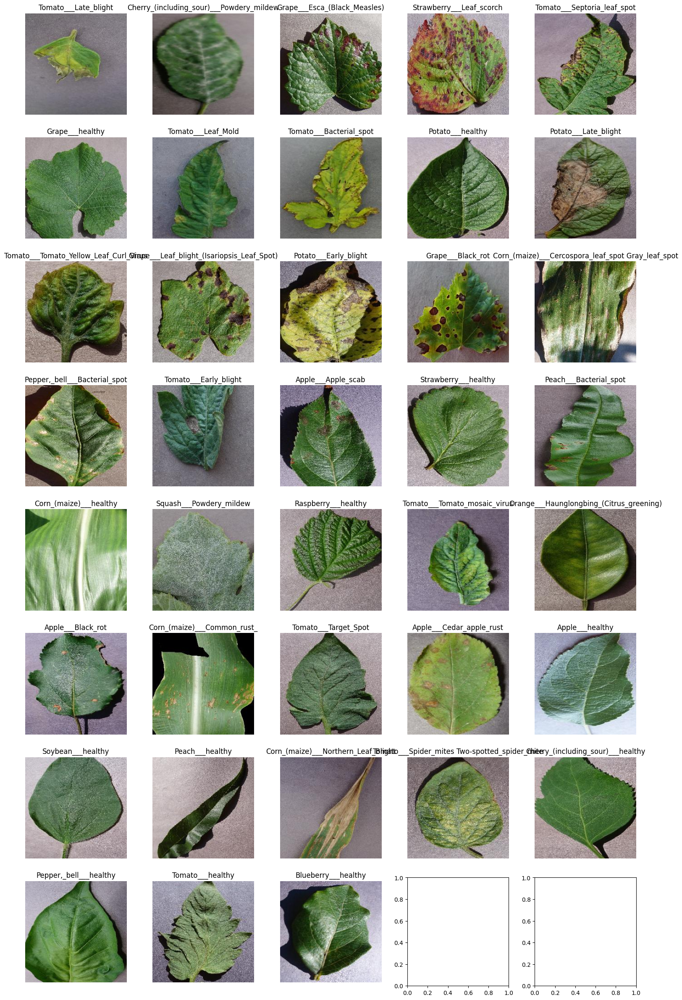

In [15]:
unique_classes = set()
class_to_idx = train_dataset.class_to_idx
idx_to_class = {v: k for k, v in class_to_idx.items()}

num_classes = len(class_to_idx)
num_rows = math.ceil(num_classes/5)
num_cols = min(5, num_classes)

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, num_rows * 3))

row_index = 0
col_index = 0

for images, labels in train_loader:
    for image, label in zip(images, labels):
        class_name = idx_to_class[label.item()]
        if class_name not in unique_classes:
            unique_classes.add(class_name)
            ax = axes[row_index, col_index]
            img = image.numpy().transpose((1, 2, 0))
            mean = np.array([0.485, 0.456, 0.406])
            std = np.array([0.229, 0.224, 0.225])
            img = std * img + mean
            img = np.clip(img, 0, 1)

            ax.imshow(img)
            ax.set_title(class_name)
            ax.axis('off')

            col_index += 1
            if col_index == num_cols:
                col_index = 0
                row_index += 1

        if len(unique_classes) == num_classes:
            break
    if len(unique_classes) == num_classes:
        break

plt.tight_layout()
plt.show()

In [16]:
class_names = {
    0: 'Apple___Black_rot',
    1: 'Apple___Apple_scab',
    2: 'Apple___healthy',
    3: 'Blueberry___healthy',
    4: 'Apple___Cedar_apple_rust',
    5: 'Cherry_(including_sour)___Powdery_mildew',
    6: 'Cherry_(including_sour)___healthy',
    7: 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot',
    8: 'Corn_(maize)___Common_rust_',
    9: 'Corn_(maize)___Northern_Leaf_Blight',
    10: 'Corn_(maize)___healthy',
    11: 'Grape___Black_rot',
    12: 'Grape___Esca_(Black_Measles)',
    13: 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
    14: 'Grape___healthy',
    15: 'Orange___Haunglongbing_(Citrus_greening)',
    16: 'Peach___Bacterial_spot',
    17: 'Peach___healthy',
    18: 'Pepper,_bell___Bacterial_spot',
    19: 'Pepper,_bell___healthy',
    20: 'Potato___Early_blight',
    21: 'Potato___Late_blight',
    22: 'Potato___healthy',
    23: 'Raspberry___healthy',
    24: 'Soybean___healthy',
    25: 'Squash___Powdery_mildew',
    26: 'Strawberry___Leaf_scorch',
    27: 'Strawberry___healthy',
    28: 'Tomato___Bacterial_spot',
    29: 'Tomato___Late_blight',
    30: 'Tomato___Early_blight',
    31: 'Tomato___Leaf_Mold',
    32: 'Tomato___Septoria_leaf_spot',
    33: 'Tomato___Target_Spot',
    34: 'Tomato___Tomato_Yellow_Leaf_Curl_Virus',
    35: 'Tomato___Tomato_mosaic_virus',
    36: 'Tomato___healthy',
    37: 'Tomato___Spider_mites Two-spotted_spider_mite'
}



In [17]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001)

In [18]:
torch.cuda.is_available()

True

In [19]:
print(32 * len(train_loader))

6048


In [20]:
import torch.nn as nn

# finallayer of neural network model
final_layer = None

# Iterate over the layers of the model to find the final layer
for layer in model.modules():
    if isinstance(layer, nn.Linear) or isinstance(layer, nn.Conv2d):
        final_layer = layer

# Print the number of output units in the final layer
if final_layer is not None:
    num_output_units = final_layer.out_features
    print("nodes in the output layer of a neural network:", num_output_units)
else:
    print("Layer not found, recheck the architecure")


nodes in the output layer of a neural network: 38


In [21]:
import pandas as pd
from torch.utils.tensorboard import SummaryWriter

In [22]:
# Define the path for TensorBoard summary
TENSORBOARD_SUMMARY_PATH = f'{DATASET_DIR}/Vgg19_PlantVillage'
writer = SummaryWriter(TENSORBOARD_SUMMARY_PATH)

In [25]:
BEST_MODEL_PATH='/content/drive/MyDrive/AAI_Dataset/PlantVillage/Vgg19_PlantVillage/events.out.tfevents.1710950765.d30585750db7.911.0'

In [24]:
import time
import pandas as pd

def train_epoch(model, train_loader, criterion, optimizer, device):
    model.train()
    train_loss = 0
    train_correct = 0

    for feature, target in train_loader:
        feature, target = feature.to(device), target.to(device)
        optimizer.zero_grad()
        output = model(feature)
        loss = criterion(output, target)
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * feature.shape[0]
        train_correct += (output.argmax(1) == target).sum().item()

        # Clear GPU memory
        del feature, target, output
        torch.cuda.empty_cache()

    train_loss /= len(train_loader.dataset)
    train_accuracy = train_correct / len(train_loader.dataset)

    return train_loss, train_accuracy

def validate_epoch(model, val_loader, criterion, device):
    model.eval()
    val_loss = 0
    val_correct = 0

    with torch.no_grad():
        for feature, target in val_loader:
            feature, target = feature.to(device), target.to(device)
            output = model(feature)
            loss = criterion(output, target)
            val_loss += loss.item() * feature.shape[0]
            val_correct += (output.argmax(1) == target).sum().item()

            # Clear GPU memory
            del feature, target, output
            torch.cuda.empty_cache()

    val_loss /= len(val_loader.dataset)
    val_accuracy = val_correct / len(val_loader.dataset)

    return val_loss, val_accuracy

# Define the number of epochs
num_epochs = 32

# Initialize a DataFrame to store training statistics
dataframe = pd.DataFrame(columns=["Epoch", "Train Loss", "Train Accuracy", "Val Loss", "Val Accuracy"])

# Define the total number of training iterations
total_iterations = num_epochs * len(train_loader)

# Start time
start_time = time.time()

for epoch in range(num_epochs):
    train_loss, train_accuracy = train_epoch(model, train_loader, criterion, optimizer, device)
    val_loss, val_accuracy = validate_epoch(model, val_loader, criterion, device)

    # Print results for this epoch
    print('Epoch [{}/{}], Train Loss: {:.4f}, Train Acc: {:.2f}%, Val Loss: {:.4f}, Val Acc: {:.2f}%'
          .format(epoch+1, num_epochs, train_loss, train_accuracy*100, val_loss, val_accuracy*100))

    # Add training and validation metrics to DataFrame
    dataframe.loc[len(dataframe)] = [epoch+1, train_loss, train_accuracy, val_loss, val_accuracy]

# End time
end_time = time.time()

# Calculate total training time
training_time = end_time - start_time
print(f'Total training time: {training_time:.2f} seconds')


Epoch [1/32], Train Loss: 3.6380, Train Acc: 2.37%, Val Loss: 3.6308, Val Acc: 3.18%
Epoch [2/32], Train Loss: 3.6303, Train Acc: 3.43%, Val Loss: 3.6239, Val Acc: 4.50%
Epoch [3/32], Train Loss: 3.6263, Train Acc: 3.11%, Val Loss: 3.6170, Val Acc: 5.43%
Epoch [4/32], Train Loss: 3.6202, Train Acc: 3.49%, Val Loss: 3.6082, Val Acc: 5.96%
Epoch [5/32], Train Loss: 3.6077, Train Acc: 3.54%, Val Loss: 3.5919, Val Acc: 5.30%
Epoch [6/32], Train Loss: 3.5914, Train Acc: 4.14%, Val Loss: 3.5562, Val Acc: 4.64%
Epoch [7/32], Train Loss: 3.5469, Train Acc: 5.84%, Val Loss: 3.4407, Val Acc: 13.25%
Epoch [8/32], Train Loss: 3.3857, Train Acc: 9.34%, Val Loss: 3.1412, Val Acc: 19.34%
Epoch [9/32], Train Loss: 3.1925, Train Acc: 14.24%, Val Loss: 2.9130, Val Acc: 21.19%
Epoch [10/32], Train Loss: 2.9896, Train Acc: 17.98%, Val Loss: 2.6903, Val Acc: 28.08%
Epoch [11/32], Train Loss: 2.7845, Train Acc: 23.39%, Val Loss: 2.5029, Val Acc: 31.39%
Epoch [12/32], Train Loss: 2.6177, Train Acc: 26.19%, V

In [38]:
dataframe.head(10)

,Epoch,train_loss,train_accuracy,val_loss,val_accuracy
0,1.0,3.638009,0.023672,3.630840,0.031788
1,2.0,3.630335,0.034266,3.623941,0.045033
2,3.0,3.626307,0.031121,3.616981,0.054305
3,4.0,3.620206,0.034928,3.608241,0.059603
4,5.0,3.607718,0.035425,3.591867,0.052980
5,6.0,3.591366,0.041384,3.556210,0.046358
6,7.0,3.546897,0.058434,3.440687,0.132450
7,8.0,3.385654,0.093362,3.141223,0.193377
8,9.0,3.192511,0.142361,2.913043,0.211921
9,10.0,2.989569,0.179772,2.690283,0.280795


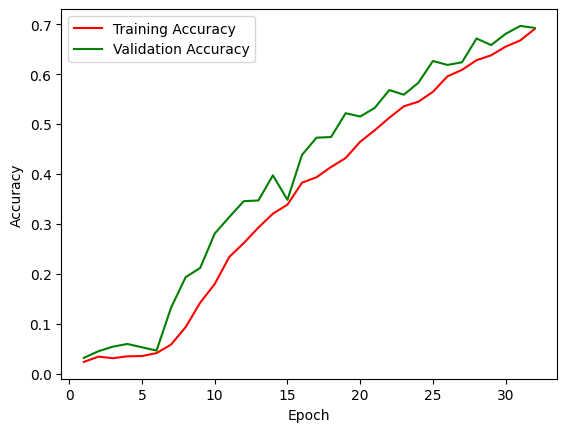

In [39]:
import matplotlib.pyplot as plt

def plot_accuracy(df, train_col, val_col, train_label, val_label):
    # Plot training accuracy
    train_plot, = plt.plot(df.Epoch, df[train_col], 'r', label=train_label)

    # Plot validation accuracy
    val_plot, = plt.plot(df.Epoch, df[val_col], 'g', label=val_label)

    # Set labels and legend

    plt.ylabel("Accuracy")
    plt.xlabel("Epoch")
    plt.legend(handles=[train_plot, val_plot], loc="lower right")

    return plt.gcf()

# Call the function with train, test, and val arguments
fig = plot_accuracy(dataframe, 'train_accuracy', 'val_accuracy', 'Training Accuracy', 'Validation Accuracy')
plt.show()


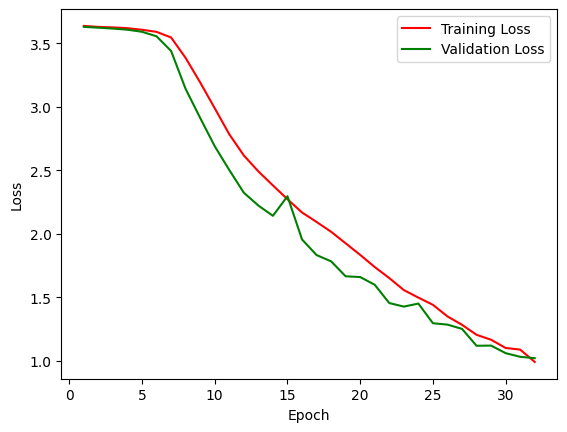

In [40]:
import matplotlib.pyplot as plt

def plot_loss_curve(train_loss, val_loss, train_label, val_label):
    epochs = range(1, len(train_loss) + 1)

    # Plot training loss
    train_plot, = plt.plot(epochs, train_loss, 'r', label=train_label)

    # Plot validation loss
    val_plot, = plt.plot(epochs, val_loss, 'g', label=val_label)

    # Set labels and legend
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend(handles=[train_plot, val_plot])

    return plt.gcf()

# Example usage:
train_loss = dataframe['train_loss']
val_loss = dataframe['val_loss']
fig = plot_loss_curve(train_loss, val_loss, 'Training Loss', 'Validation Loss')
plt.show()


In [2]:
def calculate_accuracy(model, test_loader):
    correct = 0
    total = 0
    with torch.no_grad():
        for data in test_loader:
            inputs, labels = data[0].to(device), data[1].to(device)
            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    test_accuracy = correct / total
    return test_accuracy

# Calculate and print test accuracy
test_accuracy = calculate_accuracy(model, test_loader)
print('Test accuracy: %.2f %%' % (test_accuracy * 100))


Test accuracy of this model is: 68 %


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


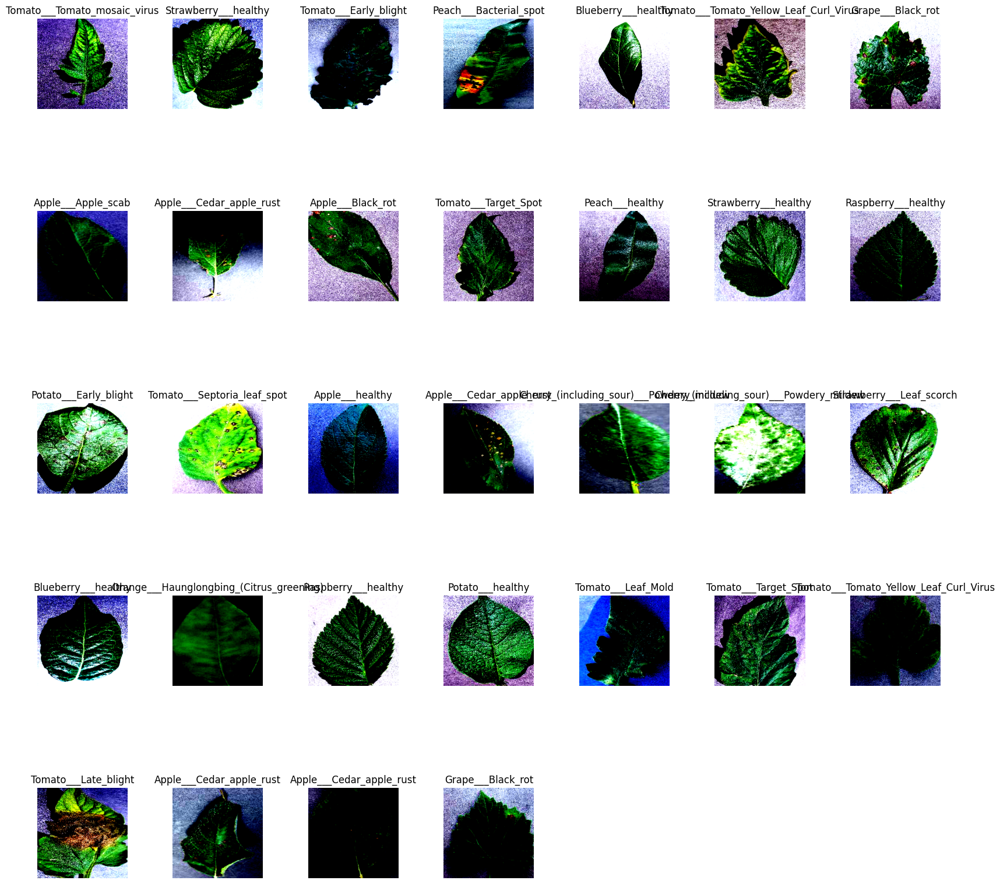

In [46]:
def plot_disease_images(inputs, classes, class_names, save_path=None):
    num_images = inputs.shape[0]
    num_rows = int(np.sqrt(num_images))
    num_cols = int(np.ceil(num_images / num_rows))

    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, 20))

    for i, ax in enumerate(axes.flat):
        if i < num_images:
            ax.imshow(inputs[i].transpose((1, 2, 0)))
            ax.set_title(f'Example of {class_names[classes[i].item()]}')
            ax.axis('off')
        else:
            ax.axis('off')

    plt.subplots_adjust(hspace=0.5, wspace=0.5)
    plt.show()

    if save_path:
        fig.savefig(save_path)

# Call the function with appropriate arguments
plot_disease_images(inputs.numpy(), classes, class_names, save_path='/content/drive/My Drive/AAI_Dataset/PlantVillageVggResultsSaving/disease_images_example.png')


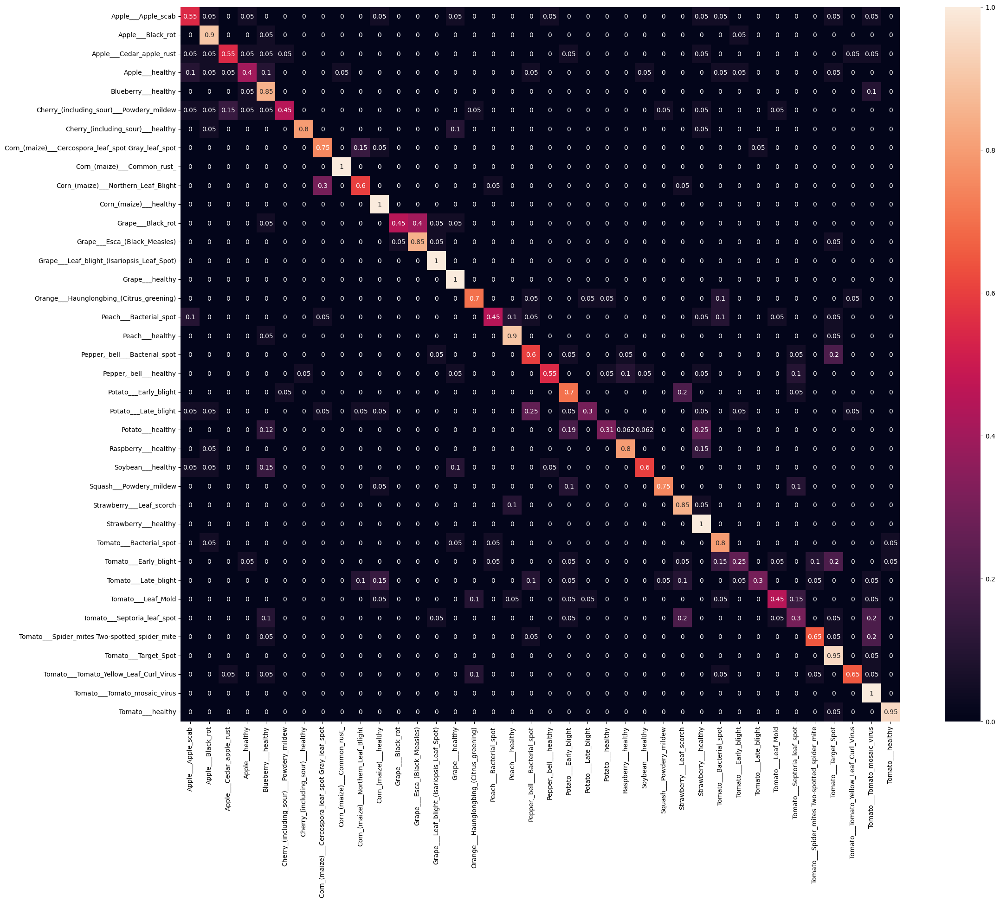

In [63]:
import torch
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
from collections import defaultdict

def get_predictions(model, test_loader):
    y_true = []
    y_pred = []

    # Iterate over test data
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)

        _, predicted = torch.max(outputs, 1)
        y_pred.extend(predicted.cpu().numpy())
        y_true.extend(labels.cpu().numpy())

    return y_true, y_pred


def plot_confusion_matrix(y_true, y_pred, class_names, save_path=None):

    confusion_matrix_dict = defaultdict(lambda: defaultdict(int))
    for true, pred in zip(y_true, y_pred):
        confusion_matrix_dict[class_names[true]][class_names[pred]] += 1

    # Convert confusion matrix to DataFrame
    df_cm = pd.DataFrame(confusion_matrix_dict).transpose()

    # Plot confusion matrix
    plt.figure(figsize=(25, 20))
    sns.heatmap(df_cm, annot=True)
    if save_path:
        plt.savefig(save_path)
    plt.show()



# Define classes and mapping predictions
class_names = test_dataset.classes
y_true, y_pred = get_predictions(model, test_loader)

# Plot and save confusion matrix
plot_confusion_matrix(y_true, y_pred, class_names, save_path='/content/drive/My Drive/AAI_Dataset/PlantVillageVggResultsSaving/confusionMatrixVgg.png')


In [54]:
dataframe.head()

,Epoch,train_loss,train_accuracy,val_loss,val_accuracy
0,1.0,3.638009,0.023672,3.630840,0.031788
1,2.0,3.630335,0.034266,3.623941,0.045033
2,3.0,3.626307,0.031121,3.616981,0.054305
3,4.0,3.620206,0.034928,3.608241,0.059603
4,5.0,3.607718,0.035425,3.591867,0.052980


In [66]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report

# Iterate through test data to get predictions
y_true = []
y_pred = []

for data in test_loader:
    inputs, labels = data[0].to(device), data[1].to(device)
    outputs = model(inputs)
    _, predicted = torch.max(outputs, 1)
    y_true.extend(labels.cpu().numpy())
    y_pred.extend(predicted.cpu().numpy())



# Calculate and print classification report
class_names = test_dataset.classes
print(classification_report(y_true, y_pred, target_names=class_names))


# Calculate accuracy
accuracy = accuracy_score(y_true, y_pred)
print("Overall accuracy==> ".format(accuracy))

                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.58      0.55      0.56        20
                                 Apple___Black_rot       0.67      0.90      0.77        20
                          Apple___Cedar_apple_rust       0.69      0.55      0.61        20
                                   Apple___healthy       0.62      0.40      0.48        20
                               Blueberry___healthy       0.52      0.85      0.64        20
          Cherry_(including_sour)___Powdery_mildew       0.82      0.45      0.58        20
                 Cherry_(including_sour)___healthy       0.94      0.80      0.86        20
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.65      0.75      0.70        20
                       Corn_(maize)___Common_rust_       0.95      1.00      0.98        20
               Corn_(maize)___Northern_Leaf_Blight       0.67      0.60      0.

Generating t-SNE plot for 6041 samples...


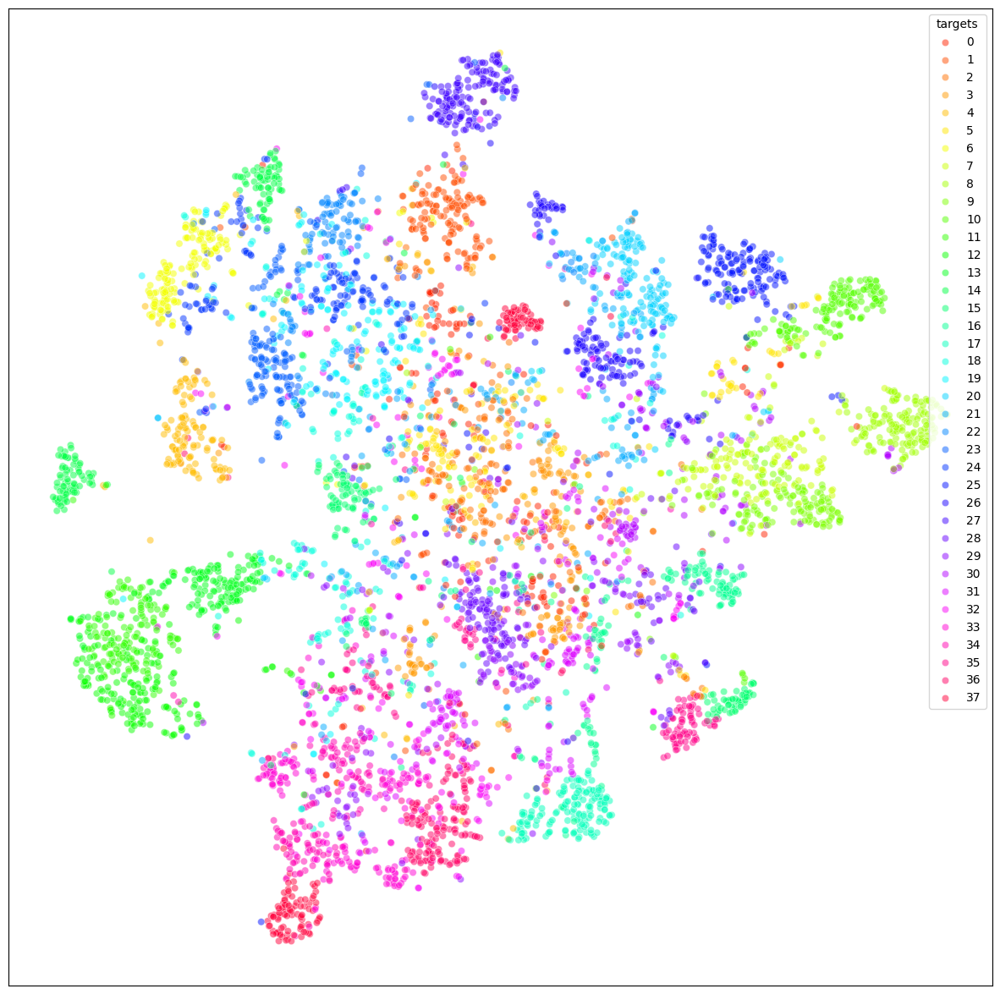

In [70]:


import pandas as pd
import matplotlib.pyplot as plt
import umap
from sklearn.preprocessing import LabelEncoder

# Define a function for generating t-SNE plot
def generate_tsne_plot(outputs, targets, save_path):
    print(f'Generating t-SNE plot for {len(outputs)} samples...')

    # Encode target labels
    label_encoder = LabelEncoder()
    encoded_targets = label_encoder.fit_transform(targets)

    # Perform t-SNE dimensionality reduction
    reducer = umap.UMAP()
    embedding = reducer.fit_transform(outputs)

    # Plot t-SNE embedding
    plt.figure(figsize=(10, 10))
    for label in set(encoded_targets):
        plt.scatter(embedding[encoded_targets == label, 0],
                    embedding[encoded_targets == label, 1],
                    label=label,
                    alpha=0.5)
    plt.xlabel('')
    plt.ylabel('')
    plt.legend()

    # Save the plot
    plt.savefig(save_path, bbox_inches='tight')
    plt.show()

# Example usage:
generate_tsne_plot(outputs, targets, '/content/drive/My Drive/AAI_Dataset/PlantVillageVggResultsSaving/PlantVillageVgg19TSNE.png')







